In [1]:

library ("igraph")
library ("Matrix")


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [2]:
facebook_G <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

## Q11 For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.

In [3]:
# i in c(1, 108, 349, 484, 1087)
i <- 1
network_for_1 <- induced_subgraph(facebook_G, c(i, neighbors(facebook_G,i)))
V(network_for_1)$name <- sort(c(i, neighbors(facebook_G,i)))

# i in c(1, 108, 349, 484, 1087)
i <- 108
network_for_108 <- induced_subgraph(facebook_G, c(i, neighbors(facebook_G,i)))
V(network_for_108)$name <- sort(c(i, neighbors(facebook_G,i)))

# i in c(1, 108, 349, 484, 1087)
i <- 349
network_for_349 <- induced_subgraph(facebook_G, c(i, neighbors(facebook_G,i)))
V(network_for_349)$name <- sort(c(i, neighbors(facebook_G,i)))


# i in c(1, 108, 349, 484, 1087)
i <- 484
network_for_484 <- induced_subgraph(facebook_G, c(i, neighbors(facebook_G,i)))
V(network_for_484)$name <- sort(c(i, neighbors(facebook_G,i)))


# i in c(1, 108, 349, 484, 1087)
i <- 1087
network_for_1087 <- induced_subgraph(facebook_G, c(i, neighbors(facebook_G,i)))
V(network_for_1087)$name <- sort(c(i, neighbors(facebook_G,i)))

In [4]:
print_emb <- function(personalized_network, node_list, n) {
    hist((degree(personalized_network, node_list)-1), main=paste("Distribution Histogram node ",n), xlab="Embeddedness", ylab="Freq")
}

### Calculate embeddedness

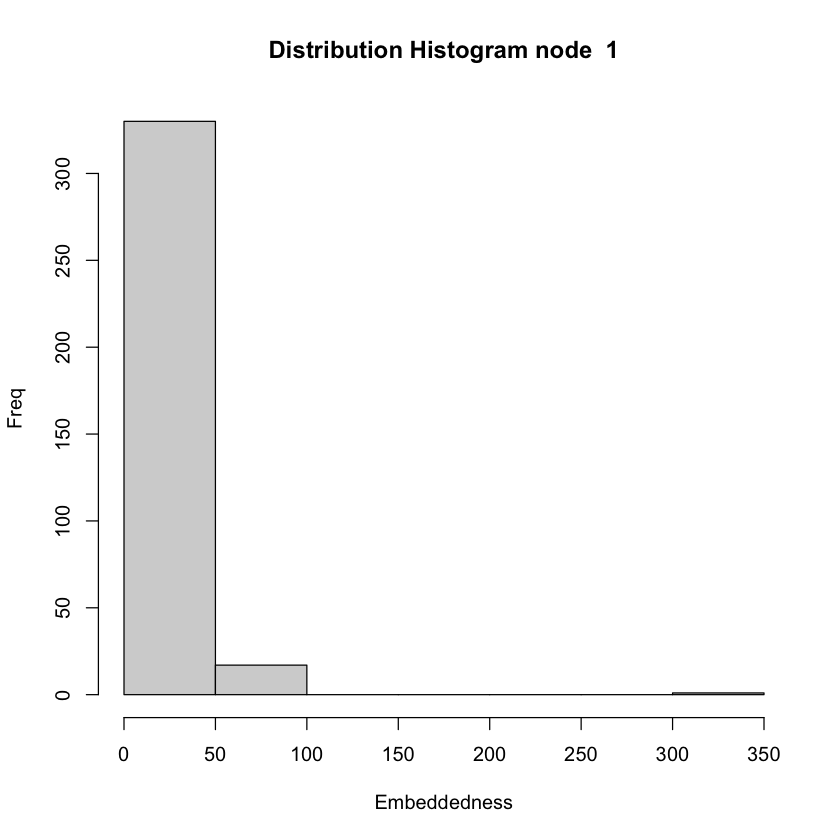

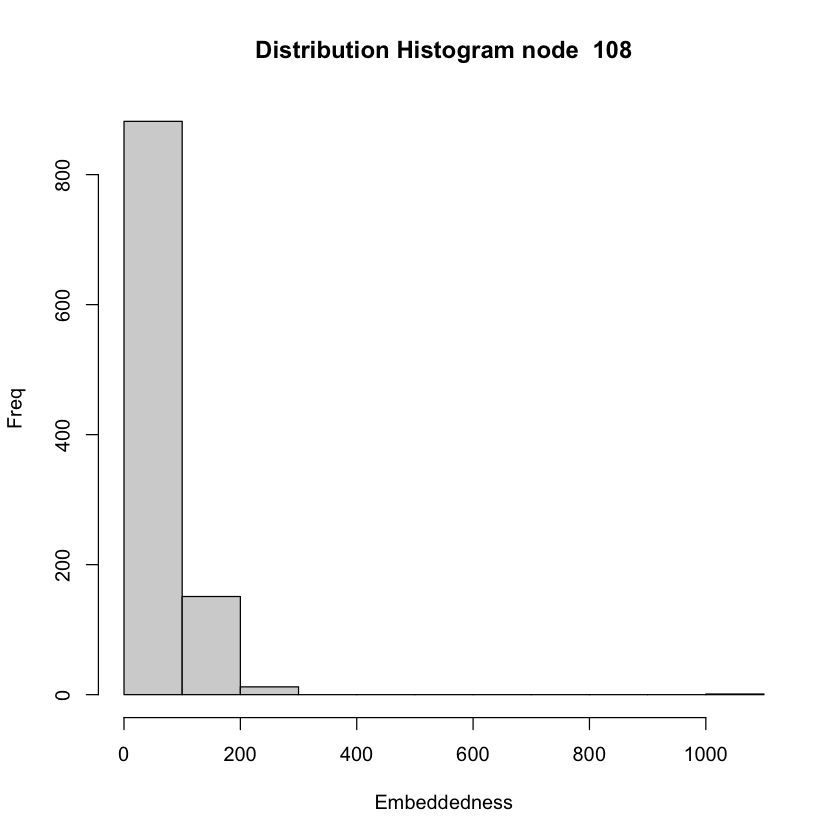

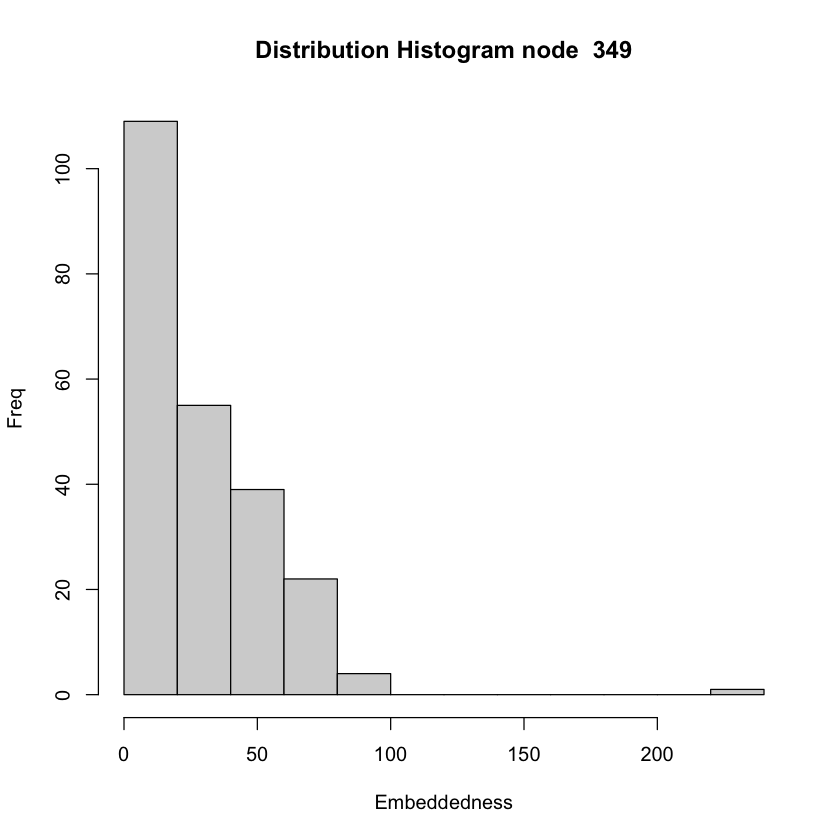

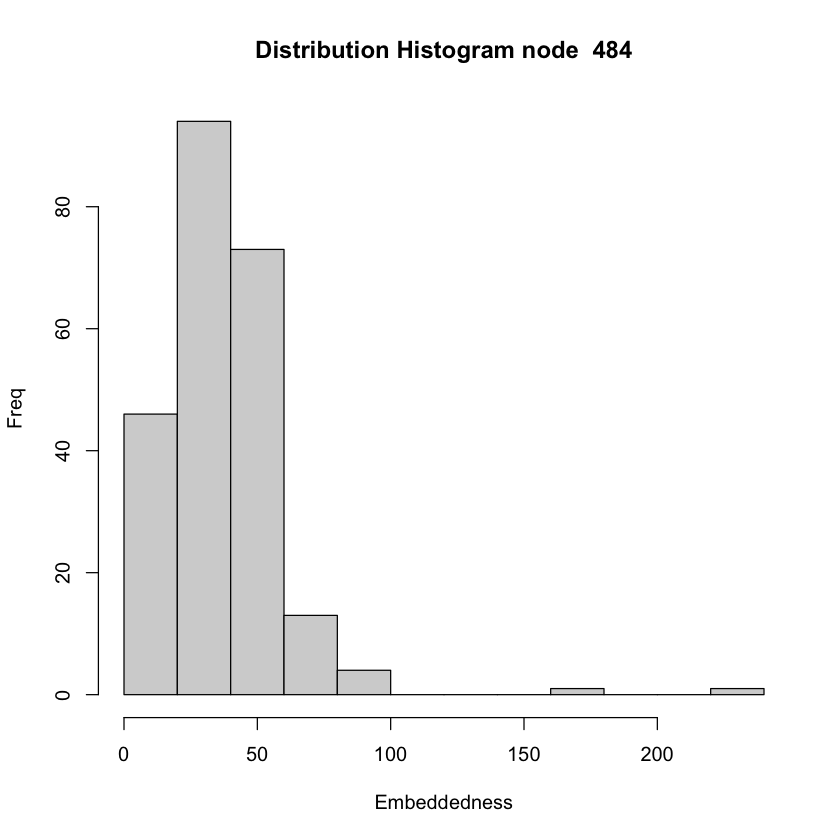

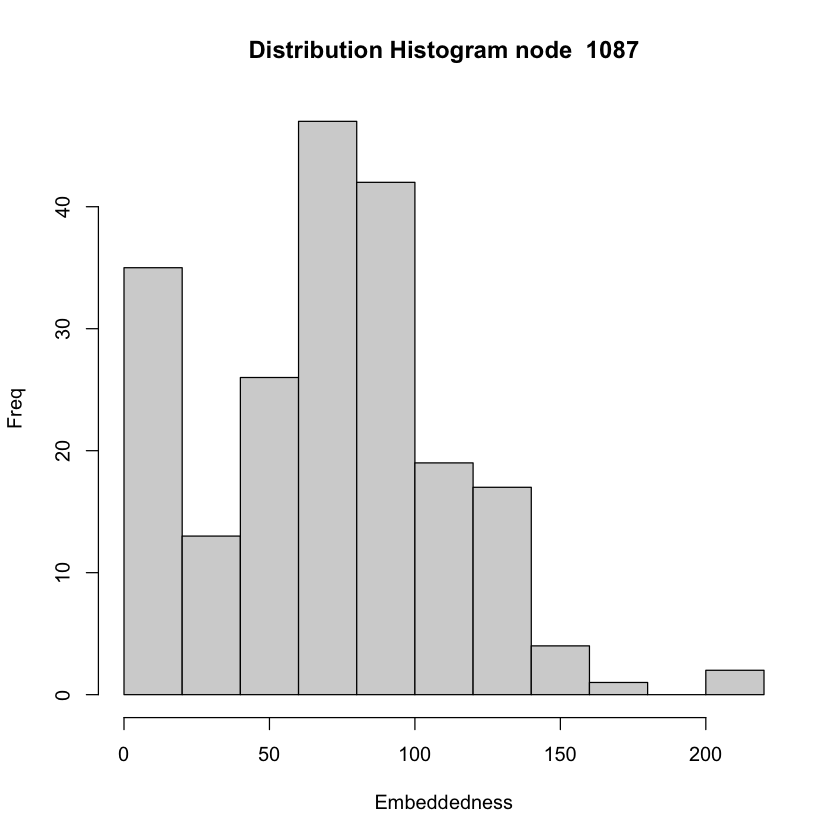

In [5]:
print_emb(network_for_1, V(network_for_1),1)
print_emb(network_for_108, V(network_for_108),108)
print_emb(network_for_349, V(network_for_349),349)
print_emb(network_for_484, V(network_for_484), 484)
print_emb(network_for_1087, V(network_for_1087), 1087)

In [11]:
# Dispersion function
disper <- function(personalized_graph, core, curr) {
    # Calculate dispertion in a personalized graph
    
    dis <- 0
    # If 
    if (degree(personalized_graph, curr) < 2) {
        return(0)
    }
    else {
        # get all friends exeept core
        mutual_friends <- neighbors(personalized_graph, curr)[-which(neighbors(personalized_graph, curr)$name==core)]
        mutual_friends <- as.numeric(mutual_friends$name)
        # remove two nodes: curr and core
        removed_graph <- induced_subgraph(personalized_graph,
                                        V(personalized_graph)[-c(which(V(personalized_graph)$name==core),curr)])
        
        num <- length(mutual_friends)
        for (i in 1:(num-1)) {
            for (j in (i+1):num) {
                
                dis <- dis + as.numeric(distances(
                        removed_graph,which(V(removed_graph)$name==mutual_friends[i]),
                                                  which(V(removed_graph)$name==mutual_friends[j]))) 
                
            }
        }
        return (dis)
    }
}

### Calculate dispersion


In [20]:
disper_108 <- c()
disper_name_108 <- c()
for (node in 1:vcount(network_for_108)) {
    if (V(network_for_108)[node]$name != 108) {
        disper_108 <- c(disper_108, disper(network_for_108,108, node))
        disper_name_108 <- c(disper_name_108, V(network_for_108)[node]$name)
    }
}

In [14]:
disper_1 <- c()
disper_name_1 <- c()
for (node in 1:vcount(network_for_1)) {
    if (V(network_for_1)[node]$name != 1) {
        disper_1 <- c(disper_1, disper(network_for_1,1, node))
        disper_name_1 <- c(disper_name_1, V(network_for_1)[node]$name)
    }
}



In [17]:
disper_349 <- c()
disper_name_349 <- c()
for (node in 1:vcount(network_for_349)) {
    if (V(network_for_349)[node]$name != 349) {
        disper_349 <- c(disper_349, disper(network_for_349,349, node))
        disper_name_349 <- c(disper_name_349, V(network_for_349)[node]$name)
    }
}


In [46]:
disper_484 <- c()
disper_name_484 <- c()
for (node in 1:vcount(network_for_484)) {
    if (V(network_for_484)[node]$name != 484) {
        disper_484 <- c(disper_484, disper(network_for_484,484, node))
        disper_name_484 <- c(disper_name_484, V(network_for_484)[node]$name)
    }
}

In [19]:
disper_1087 <- c()
disper_name_1087 <- c()
for (node in 1:vcount(network_for_1087)) {
    if (V(network_for_1087)[node]$name != 1087) {
        disper_1087 <- c(disper_1087, disper(network_for_1087,1087, node))
        disper_name_1087 <- c(disper_name_1087, V(network_for_1087)[node]$name)
    }
}

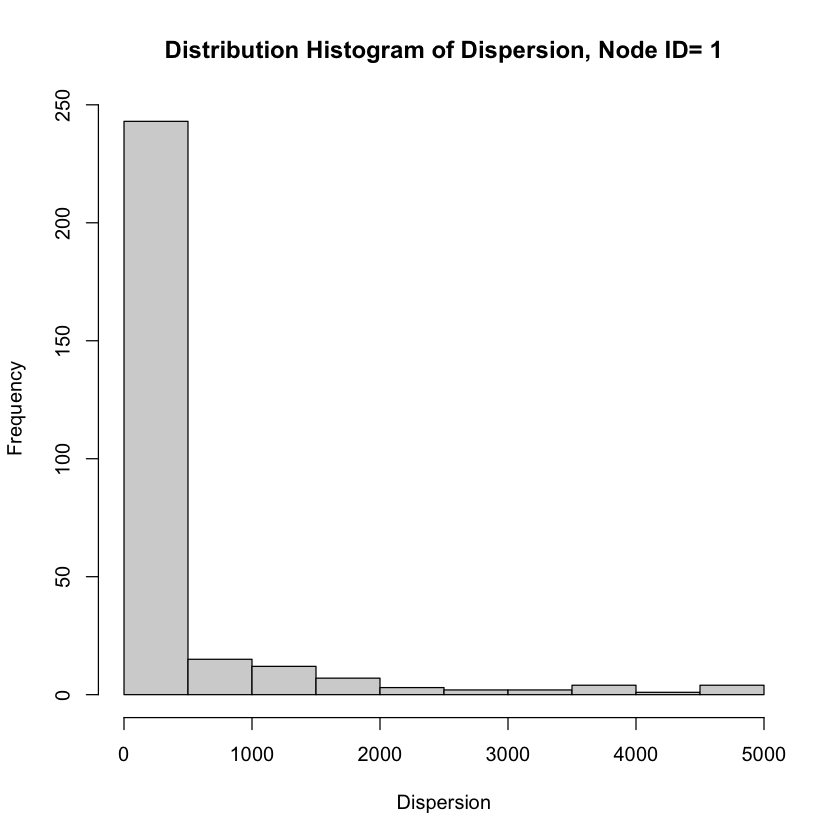

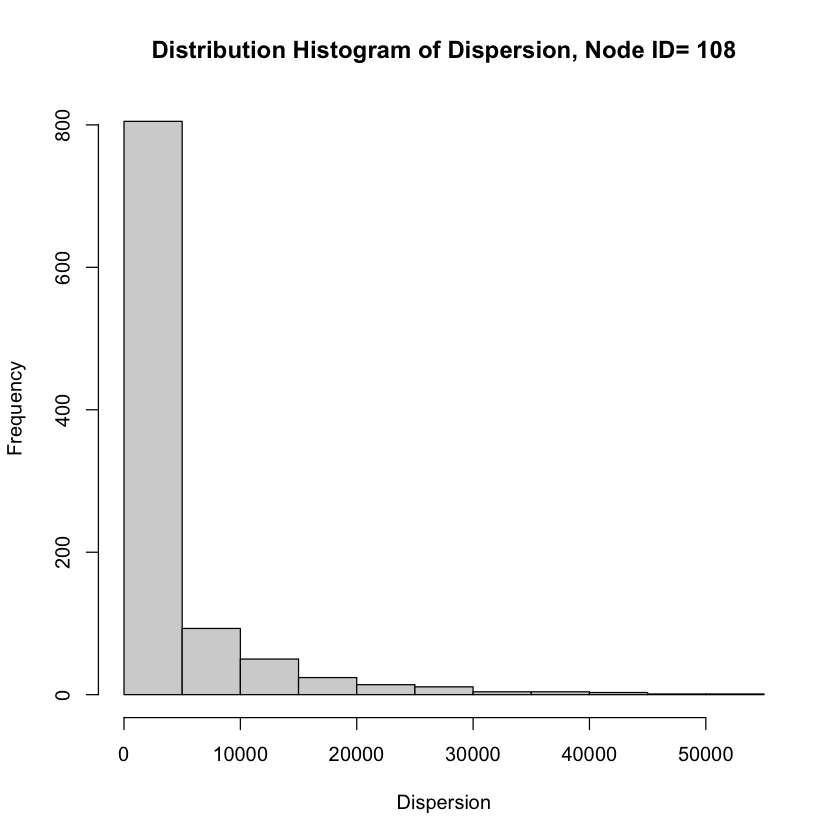

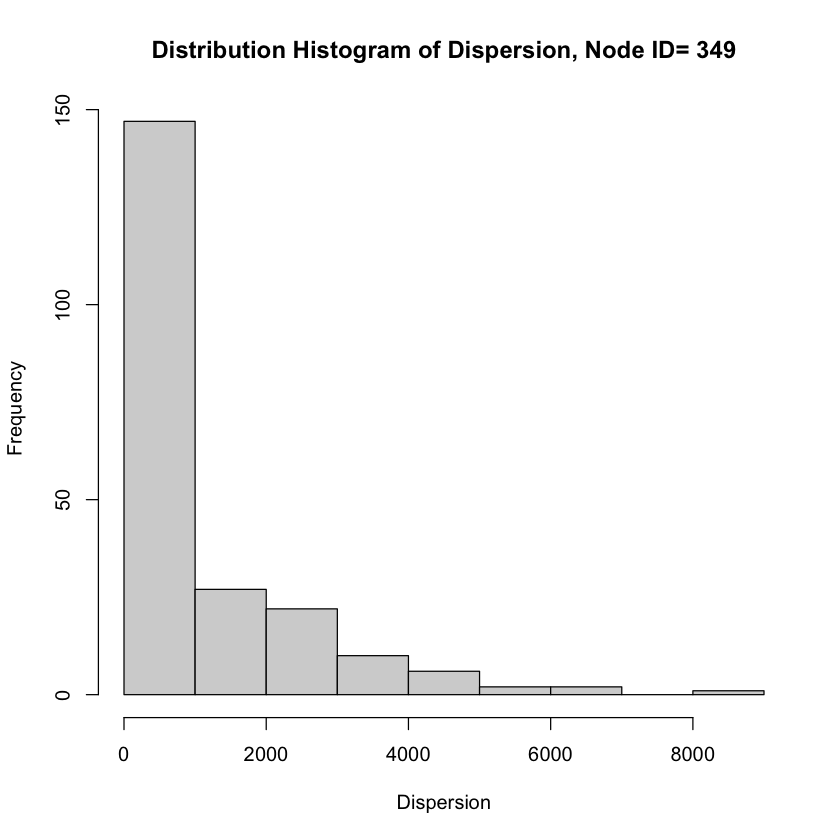

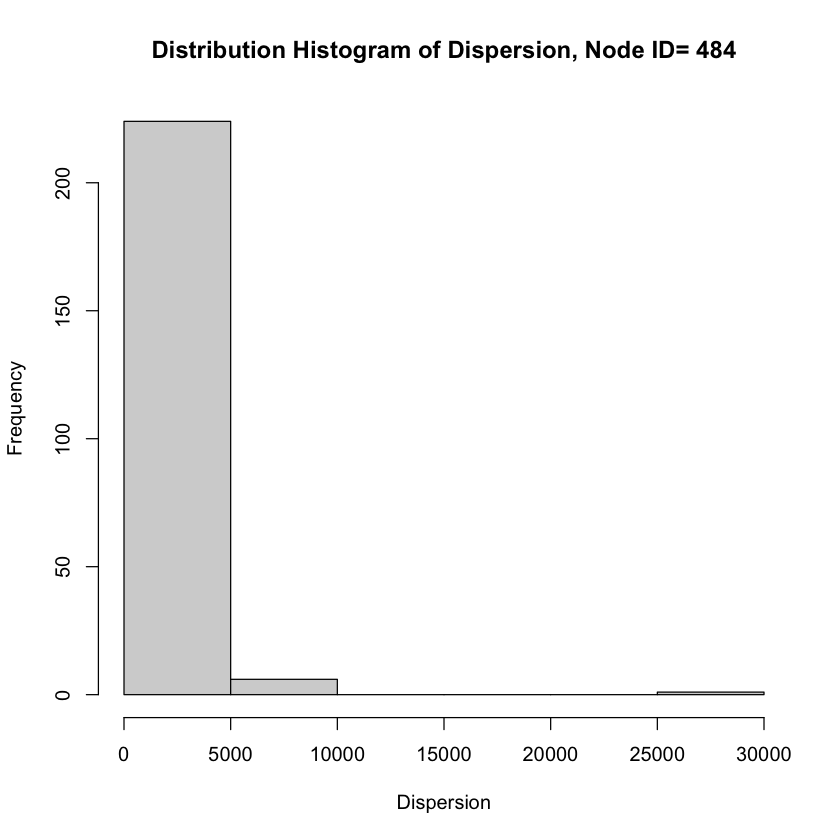

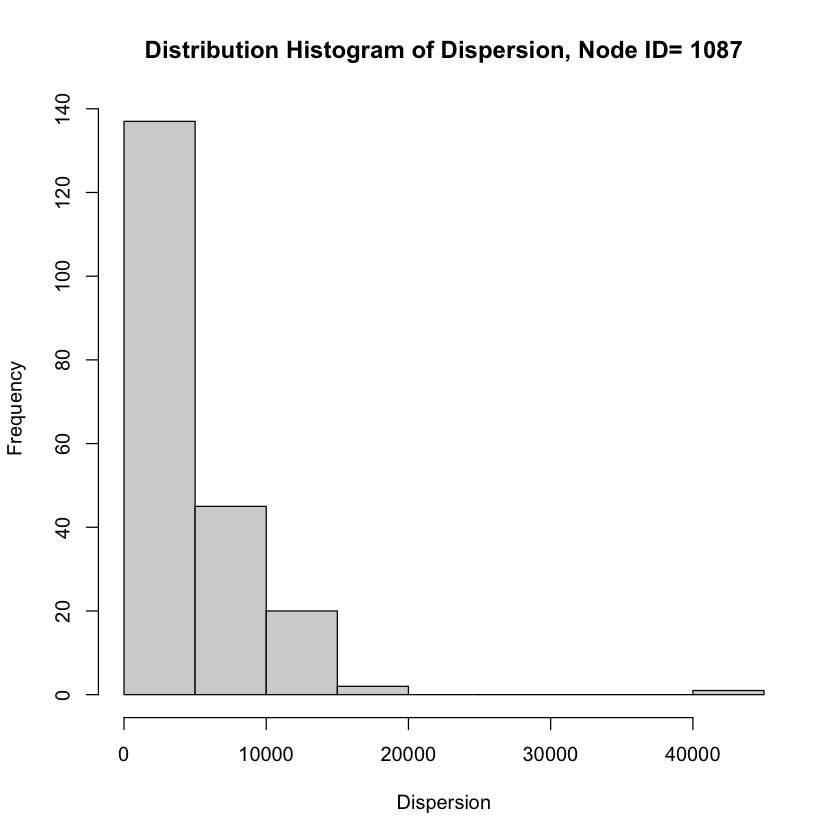

In [24]:
hist(disper_1,main="Distribution Histogram of Dispersion, Node ID= 1",xlab="Dispersion",ylab="Frequency")
hist(disper_108,main="Distribution Histogram of Dispersion, Node ID= 108",xlab="Dispersion",ylab="Frequency")
hist(disper_349,main="Distribution Histogram of Dispersion, Node ID= 349",xlab="Dispersion",ylab="Frequency")
hist(disper_484,main="Distribution Histogram of Dispersion, Node ID= 484",xlab="Dispersion",ylab="Frequency")

hist(disper_1087,main="Distribution Histogram of Dispersion, Node ID= 1087",xlab="Dispersion",ylab="Frequency")


Q13

In [73]:
plot_highlight <- function(graph, community, V_core, V_highlight, title) {
    
    V(graph)$color <- "gray"
    V(graph)[which(V(graph)$name==V_core)]$color <- "black"
    V(graph)[V_highlight]$color <- "pink"

    V(graph)$size <- 3
    V(graph)[which(V(graph)$name==V_core)]$size <- 20
    V(graph)[V_highlight]$size <- 30
    
    V(graph)$label <- NA
    flag <- 1
    for (each_highlight in V_highlight) {
        V(graph)[each_highlight]$label <- "non-core"
    }
    
   

    E(graph)$color <- "gray"
    E(graph)$width <- 1
    for (each_highlight in V_highlight) {
        E(graph)[match(incident(graph,each_highlight),E(graph))]$color <- "red"
        E(graph)[match(incident(graph,each_highlight),E(graph))]$width <- 3
    }

    plot(community, graph, 
#          vertex.label = NA, 
         vertex.color = V(graph)$color, 
         vertex.size = V(graph)$size, 
         edge.color = E(graph)$color, 
         edge.width = E(graph)$width, 
         main = title)
}

In [78]:
community_1 <- cluster_fast_greedy(network_for_1)
community_108 <- cluster_fast_greedy(network_for_108)
community_349 <- cluster_fast_greedy(network_for_349)
community_484 <- cluster_fast_greedy(network_for_484)
community_1087 <- cluster_fast_greedy(network_for_1087)

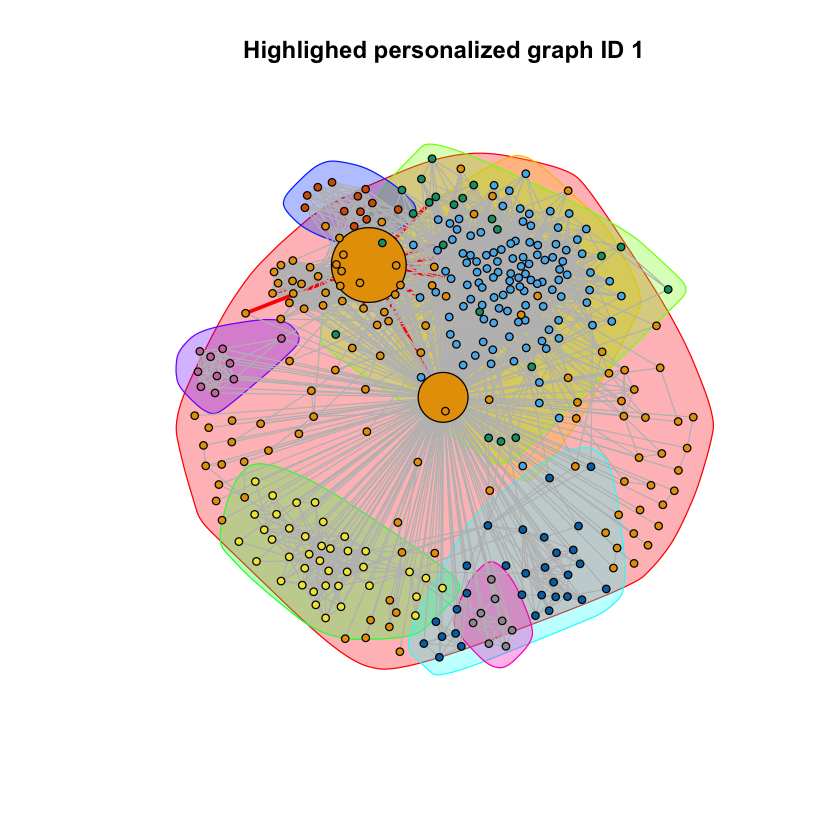

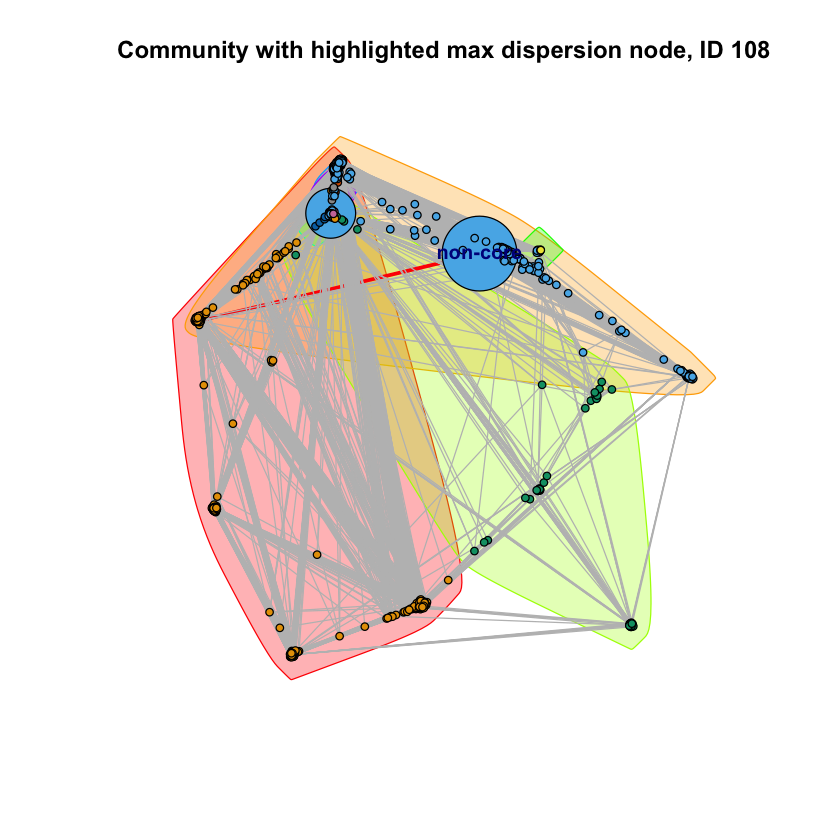

In [74]:
max_index <- which(V(network_for_1)$name==disper_name_1[which.max(disper_1)]) 
plot_highlight(network_for_1, community_1, 1, max_index, "Highlighed personalized graph ID 1")

max_index <- which(V(network_for_108)$name==disper_name_108[which.max(disper_108)]) 
plot_highlight(network_for_108, community_108, 108, max_index, "Community with highlighted max dispersion node, ID 108")





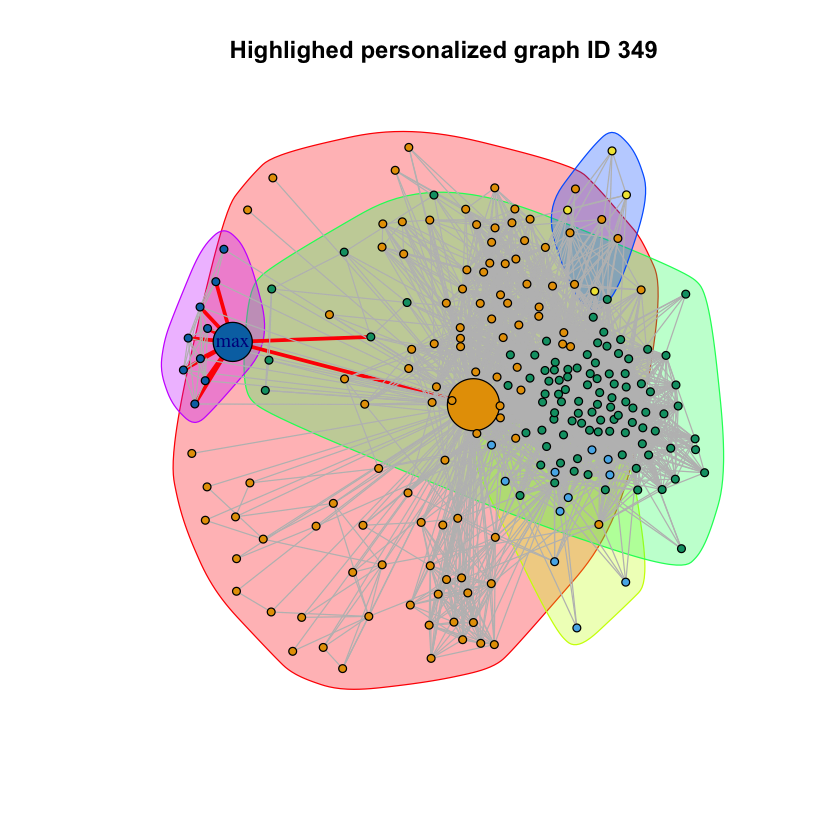

In [57]:


max_index <- which(V(network_for_349)$name==disper_name_349[which.max(disper_349)]) 
plot_highlight(network_for_349, community_349, 349, max_index, "Highlighed personalized graph ID 349")

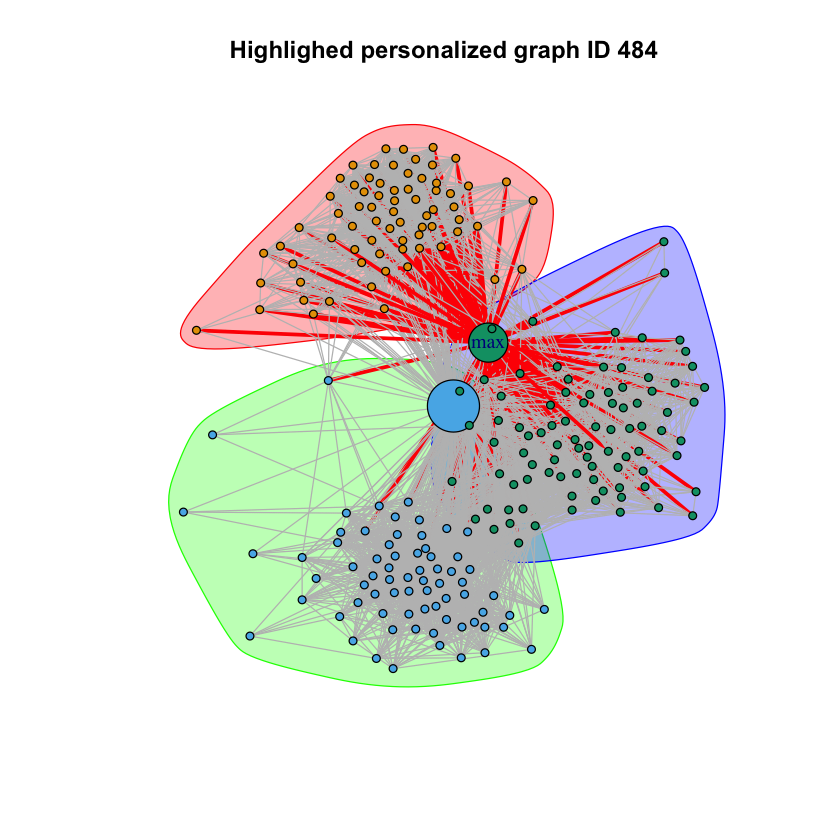

In [56]:
max_index <- which(V(network_for_484)$name==disper_name_484[which.max(disper_484)]) 
plot_highlight(network_for_484, community_484, 484, max_index, "Highlighed personalized graph ID 484")

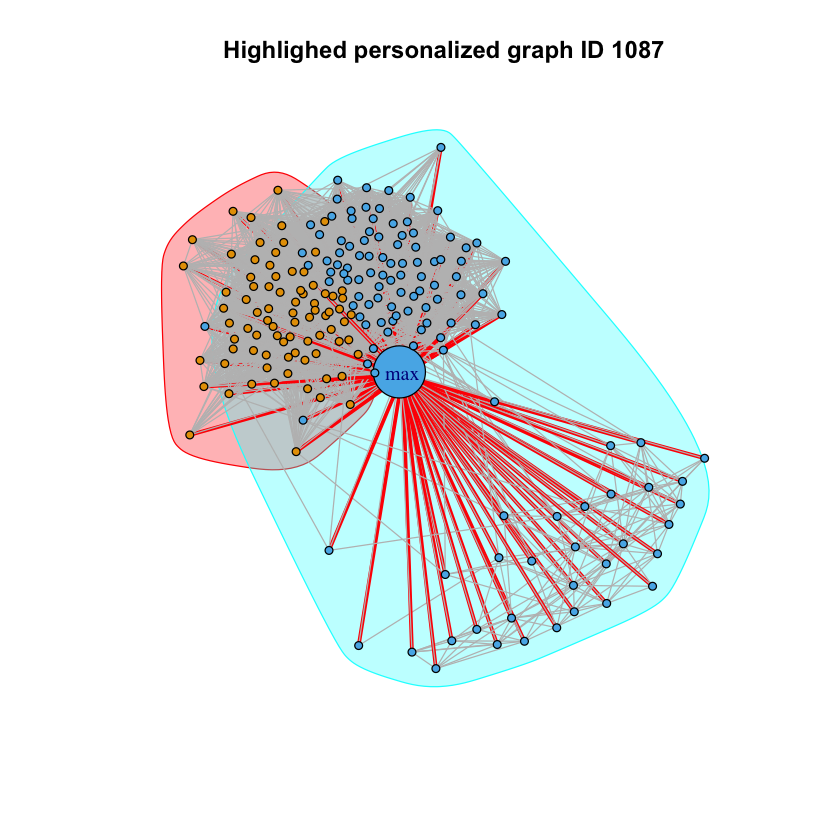

In [58]:
max_index <- which(V(network_for_1087)$name==disper_name_1087[which.max(disper_1087)]) 
plot_highlight(network_for_1087, community_1087, 1087, max_index, "Highlighed personalized graph ID 1087")

## Q14 

In [84]:
# Embeddedness function
embed_Value <- function(g, node) {
    return(degree(g, node)-1)
}

embed_1 <- embed_Value(network_for_1,V(network_for_1)[-which(V(network_for_1)$name==1)])
embed_108 <- embed_Value(network_for_108,V(network_for_108)[-which(V(network_for_108)$name==108)])
embed_349 <- embed_Value(network_for_349,V(network_for_349)[-which(V(network_for_349)$name==349)])
embed_484 <- embed_Value(network_for_484,V(network_for_484)[-which(V(network_for_484)$name==484)])
embed_1087 <- embed_Value(network_for_1087,V(network_for_1087)[-which(V(network_for_1087)$name==1087)])


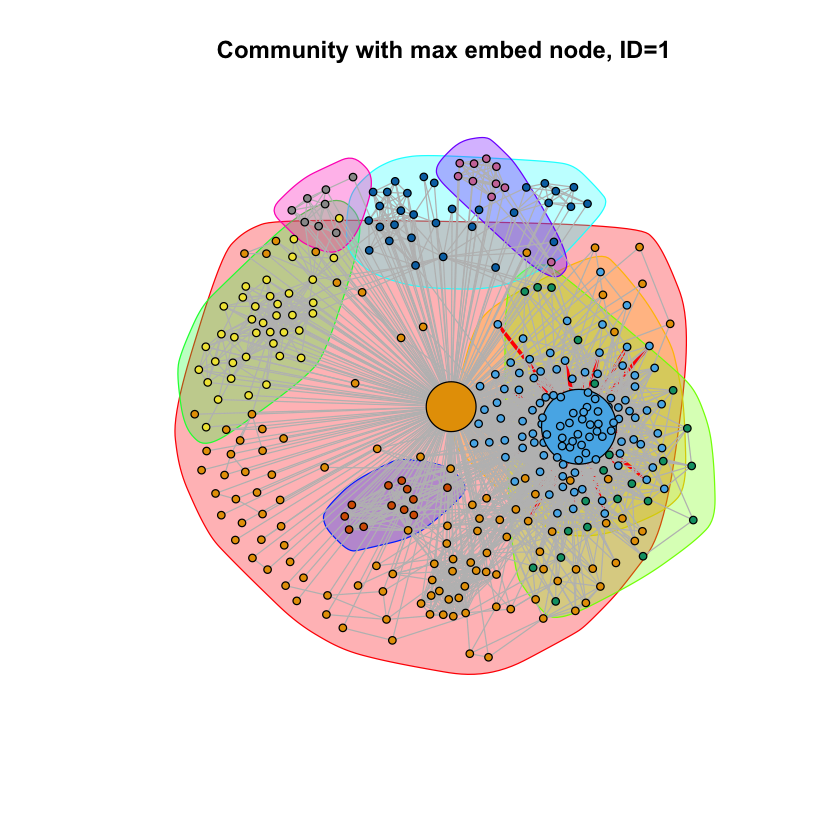

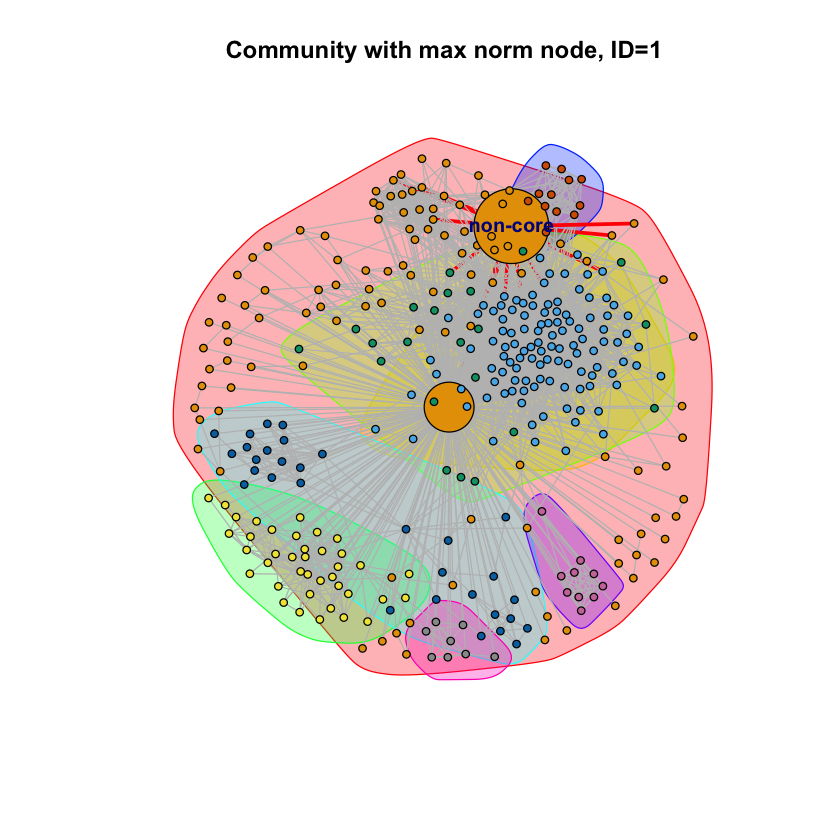

In [85]:
# First find the graph with max embedness
removed_graph <- V(network_for_1)[-which(V(network_for_1)$name==1)]$name
embed_max_1 <- which(V(network_for_1)$name==removed_graph[which.max(embed_1)])

# First find the graph with max dispersion/embedness
normalized <- c()
for (i in 1:length(disper_name_1)) {
    index <- which(V(network_for_1)$name == disper_name_1[i])
    norm_value <- disper_1[i]/embed_Value(network_for_1, index)
    normalized <- c(normalized, norm_value)
}

norm_disp_max_index <- which(V(network_for_1)$name==disper_name_1[which.max(normalized)])




plot_highlight(network_for_1, community_1, 1, 
               embed_max_1,
               "Community with max embed node, ID=1")

plot_highlight(network_for_1, community_1, 1, 
               norm_disp_max_index,
               "Community with max norm node, ID=1")

In [86]:
# First find the graph with max embedness
plot_two <- function (network, embed_v, disper_name,disper,com, core) {
    removed_graph <- V(network)[-which(V(network)$name==core)]$name
    embed_max_1 <- which(V(network)$name==removed_graph[which.max(embed_v)])

    # First find the graph with max dispersion/embedness
    normalized <- c()
    for (i in 1:length(disper_name)) {
        index <- which(V(network)$name == disper_name[i])
        norm_value <- disper[i]/embed_Value(network, index)
        normalized <- c(normalized, norm_value)
    }

    norm_disp_max_index <- which(V(network)$name==disper_name[which.max(normalized)])




    plot_highlight(network, com, core, 
                   embed_max_1,
                   paste("Community with max emb node, ID= ", core))
    
    plot_highlight(network, com, core, 
                   norm_disp_max_index,
                   paste("Community with max norm node, ID= ", core))
}


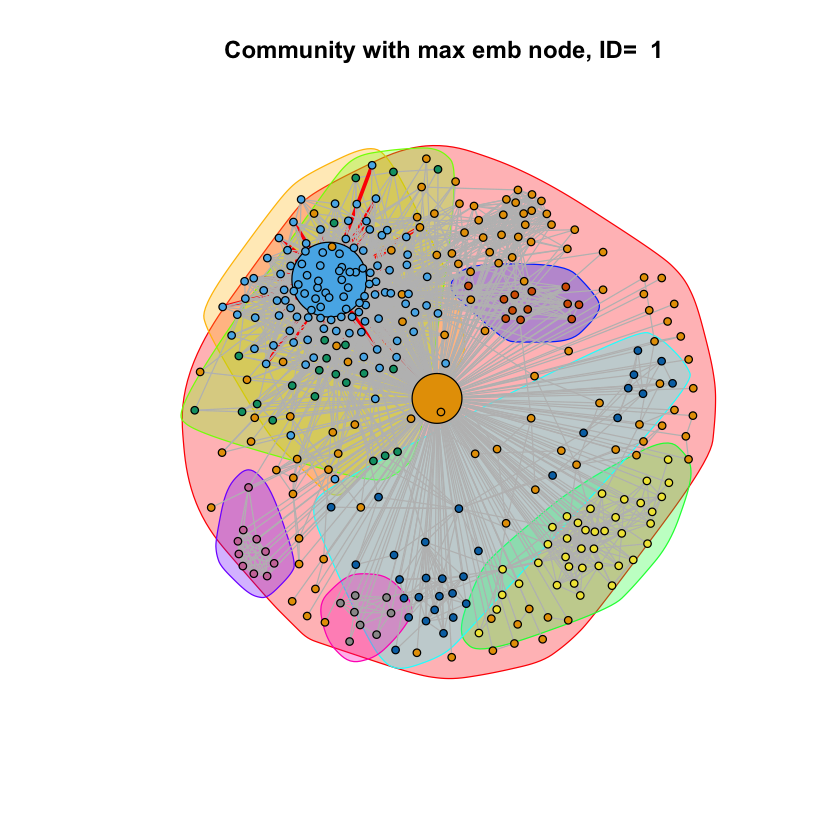

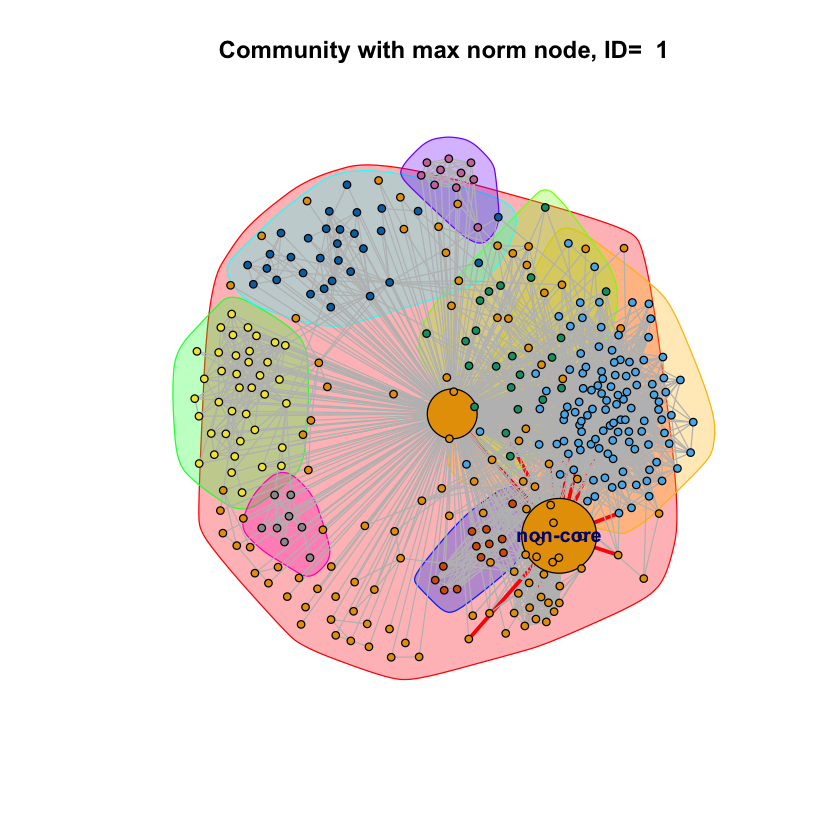

In [87]:
plot_two(network_for_1,embed_1,disper_name_1,disper_1,community_1,1 )

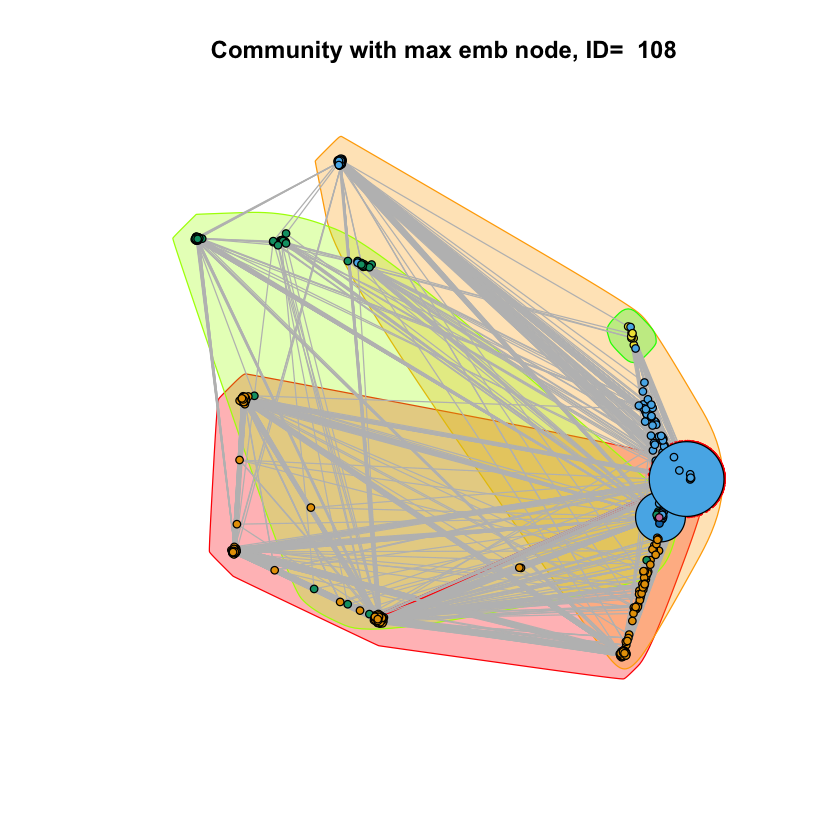

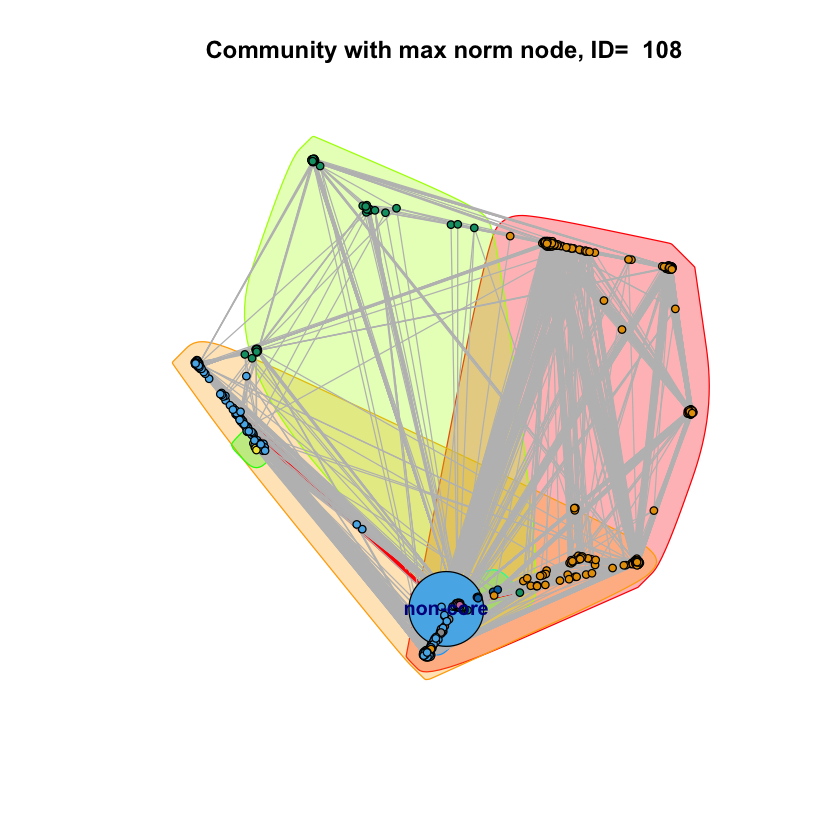

In [88]:
# i in c(1, 108, 349, 484, 1087)
plot_two(network_for_108,embed_108,disper_name_108,disper_108,community_108,108 )

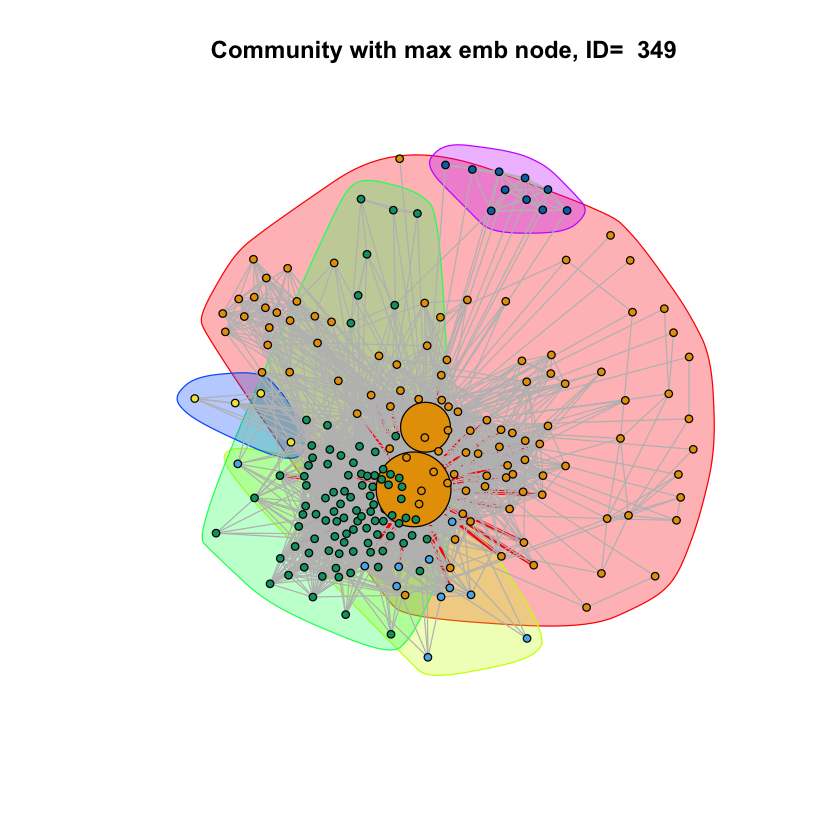

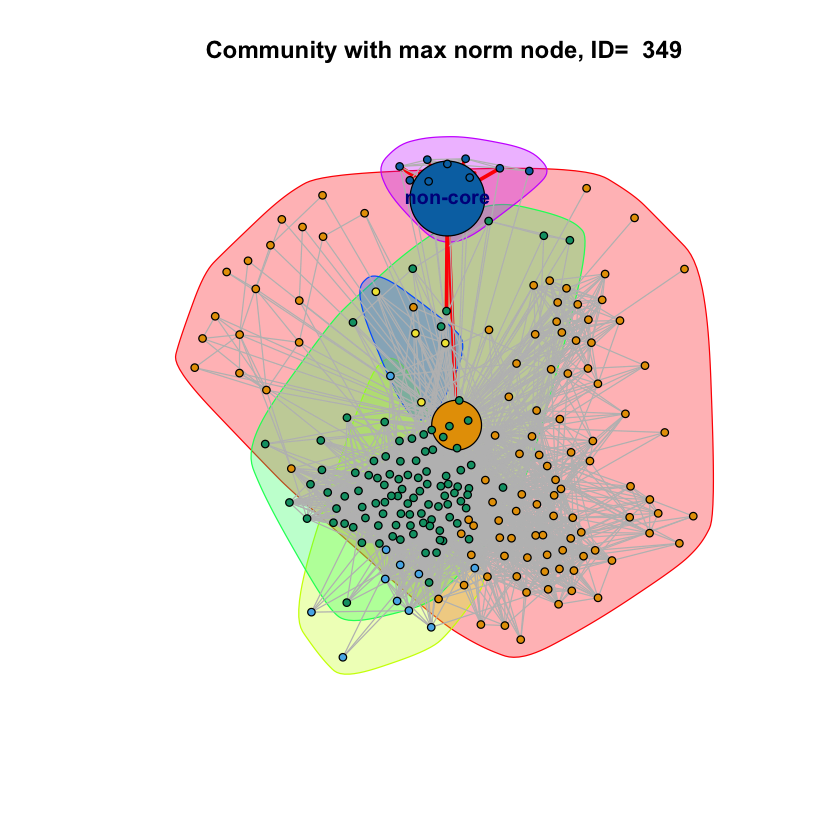

In [89]:
# i in c(1, 108, 349, 484, 1087)
plot_two(network_for_349,embed_349,disper_name_349,disper_349,community_349,349 )

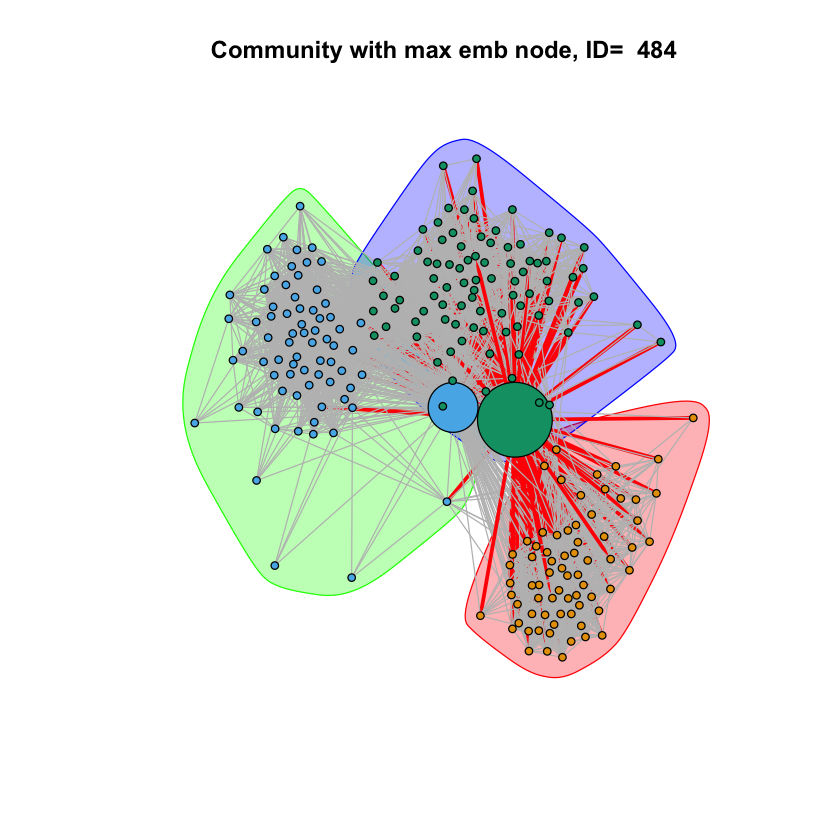

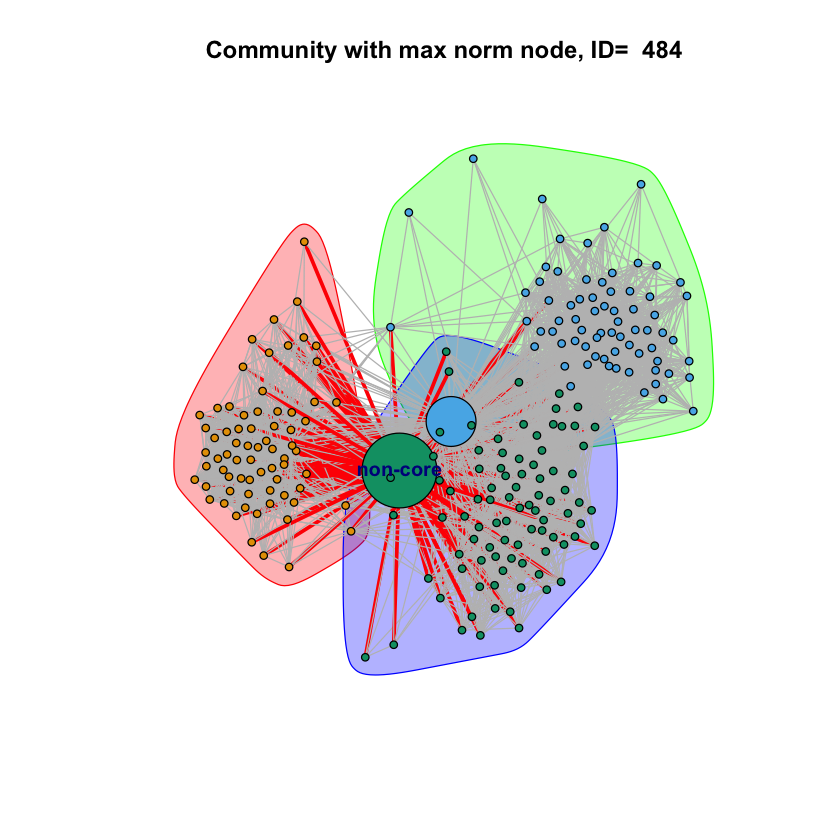

In [91]:
# i in c(1, 108, 349, 484, 1087)
plot_two(network_for_484,embed_484,disper_name_484,disper_484,community_484,484 )

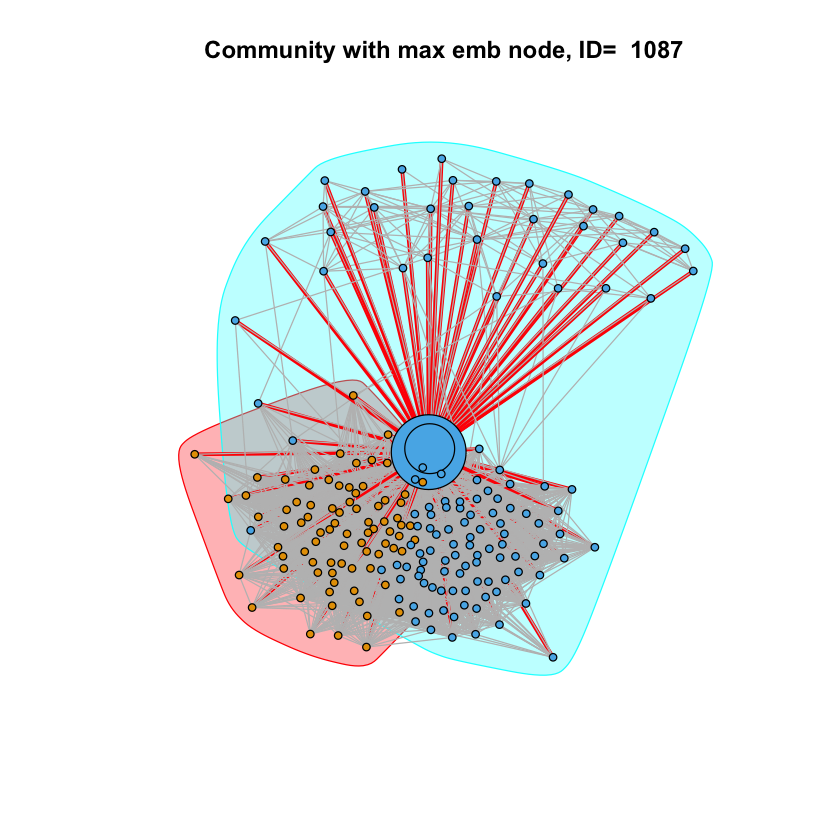

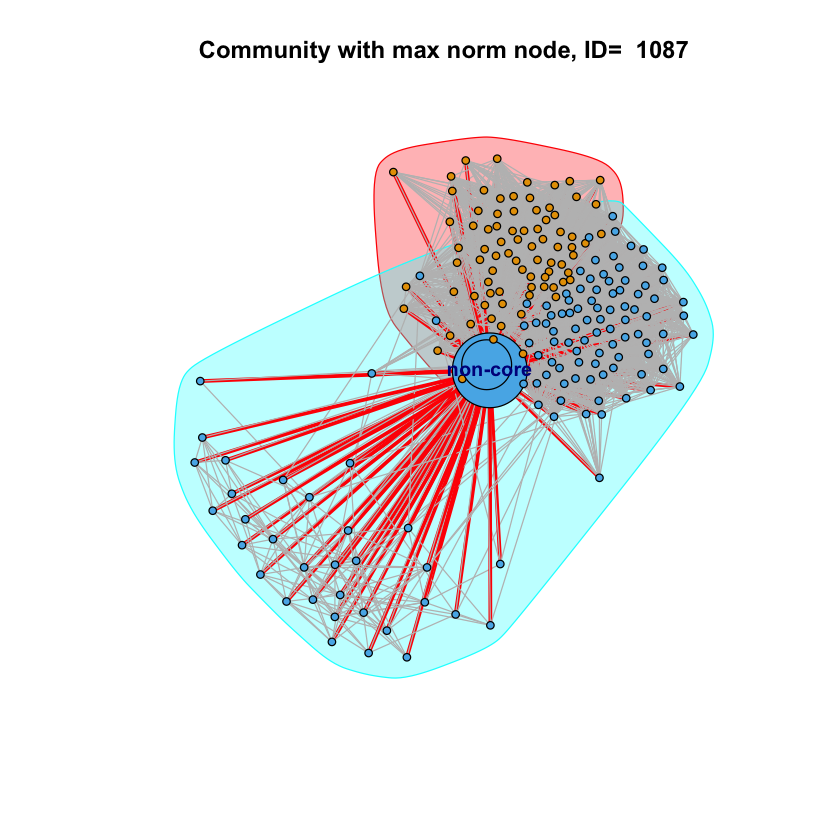

In [92]:
# i in c(1, 108, 349, 484, 1087)
plot_two(network_for_1087,embed_1087,disper_name_1087,disper_1087,community_1087,1087 )